<a href="https://colab.research.google.com/github/Shi6aSK/chaos-theory/blob/main/Chaos_Encryption.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Novel Chaotic Map
###Combination of previous maps
---


\begin{aligned}
    \text{chaotic_map}(x, a, b, c, d, e, f, g, h, \xi, \tau) &= \left( a \sin(\pi x^2) + b x (1 - x^3) + c \tanh(d \sqrt{|1 - x|}) \right. \\
    & \quad + e \ln(1 + |x|) + f \cos(g \pi x) + h e^{-x^2} \\
    & \quad + \eta(t) + \xi \sin(\pi x(t - \tau)) \Bigg) \mod 1
\end{aligned}

where:
\begin{align*}
&\text{term}_1 = a \sin(\pi x^2), \\
&\text{term}_2 = b x (1 - x^3), \\
&\text{term}_3 = c \tanh(d \sqrt{|1 - x|}), \\
&\text{term}_4 = e \ln(1 + |x|), \\
&\text{term}_5 = f \cos(g \pi x), \\
&\text{term}_6 = h e^{-x^2}, \\
&\eta(t) \text{ is a random noise term}, \\
&\xi \sin(\pi x(t - \tau)) \text{ is a delay term, with } \tau \text{ being the delay}.
\end{align*}



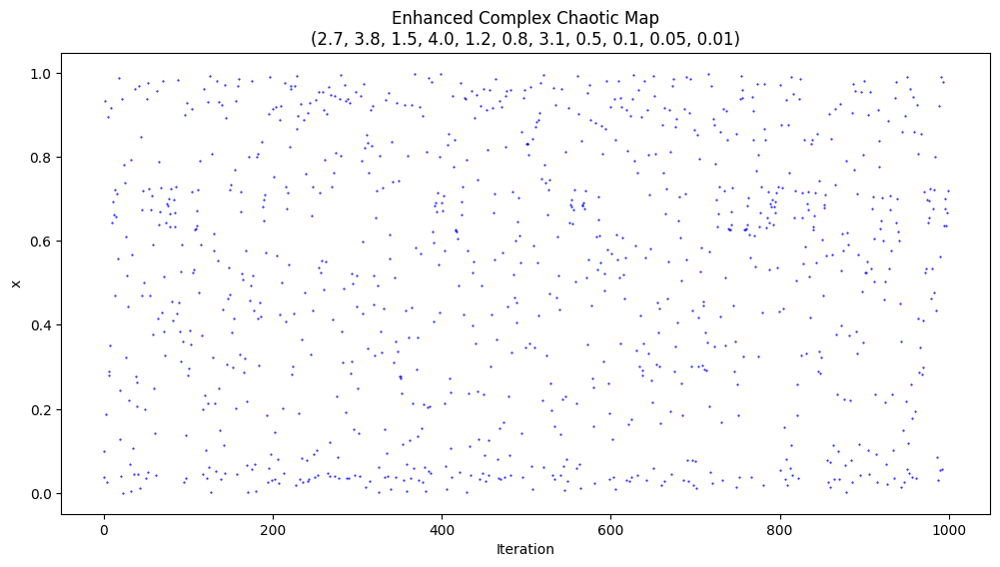

Lyapunov Exponent: 22.232668249981145
Entropy: -15.65015709399919


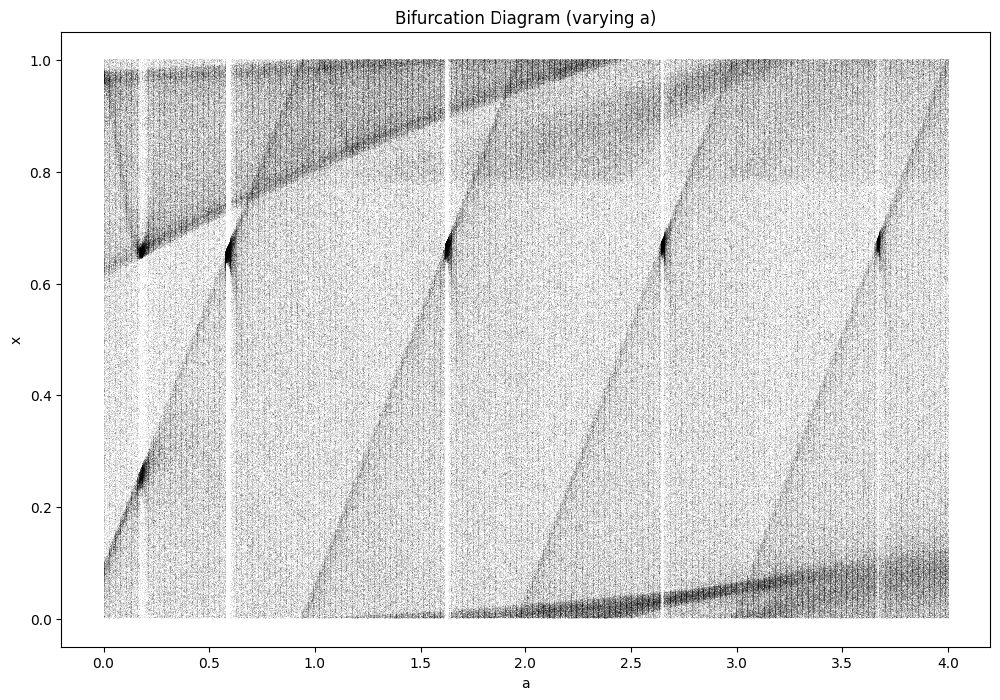

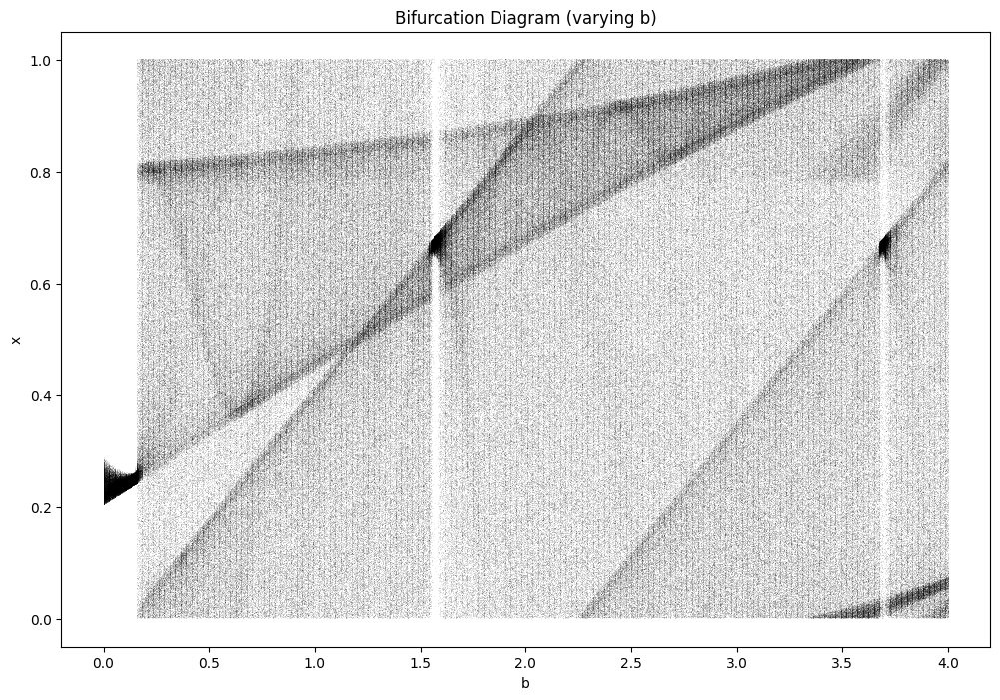

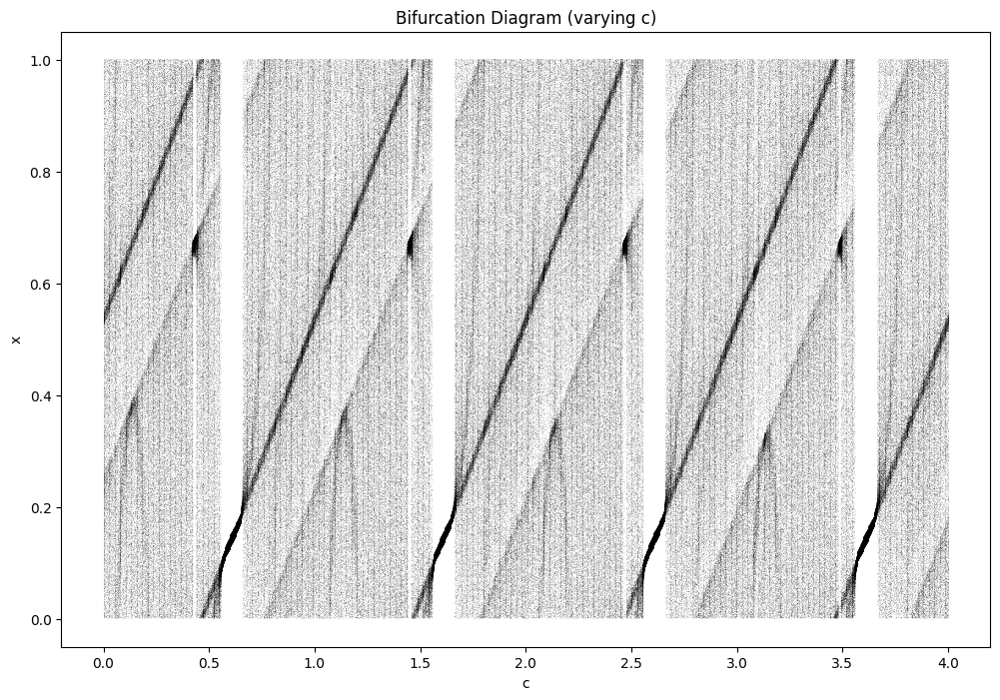

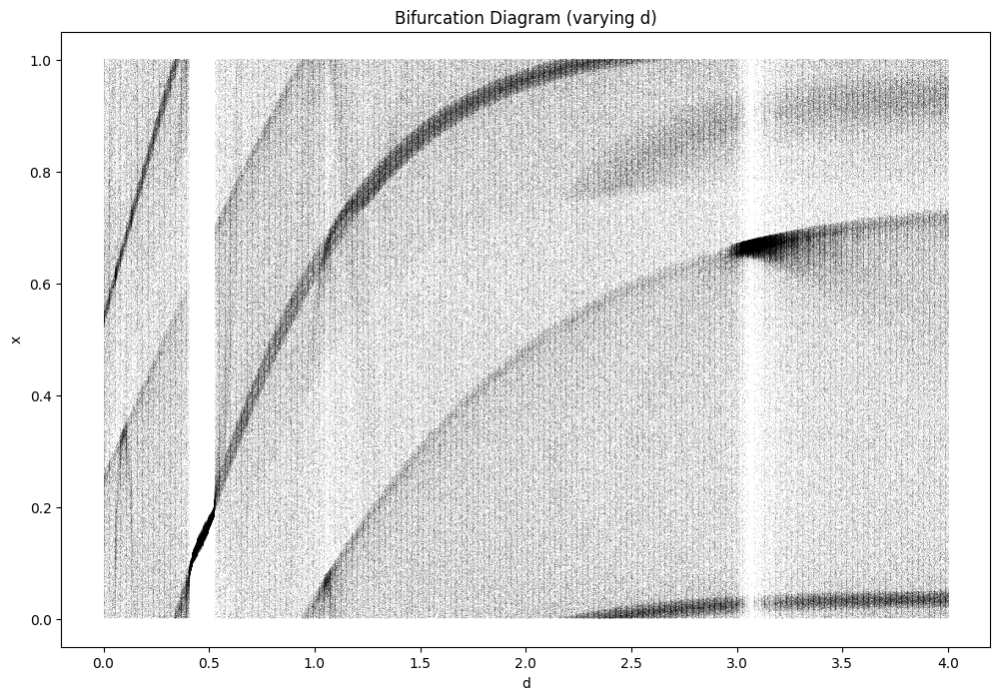

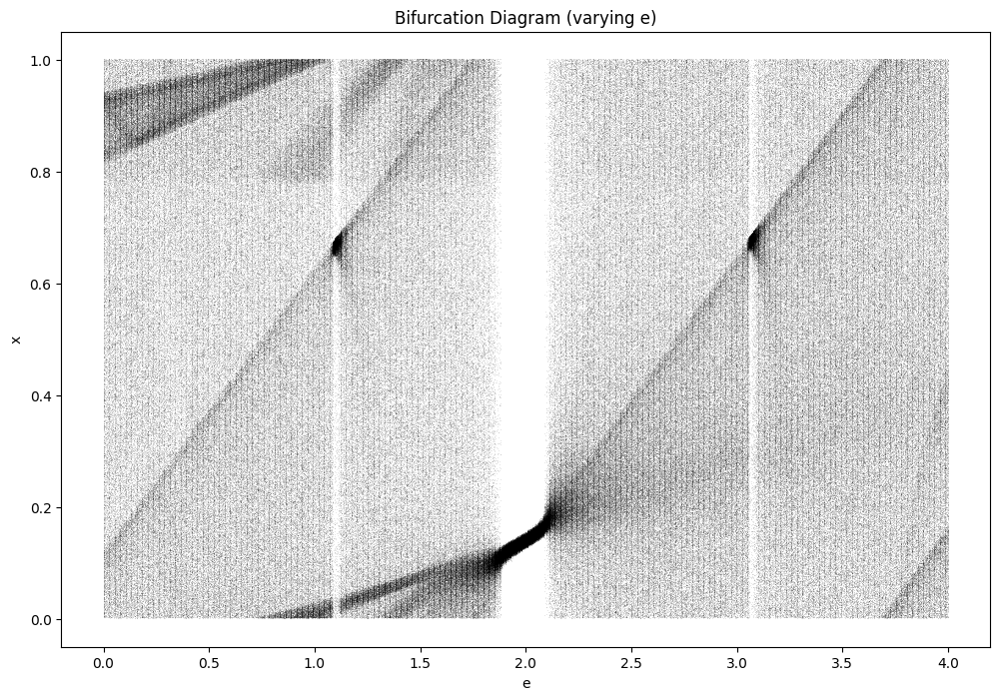

...

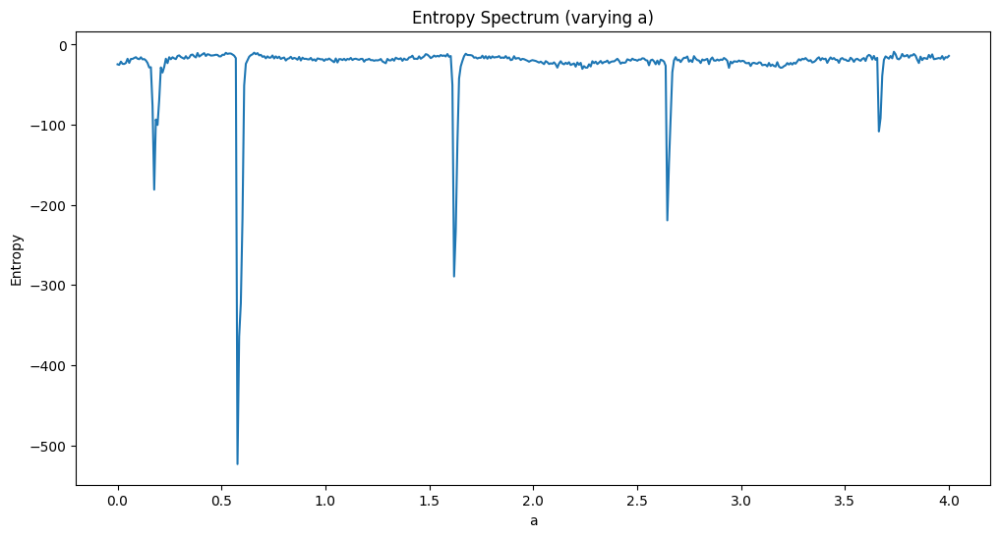

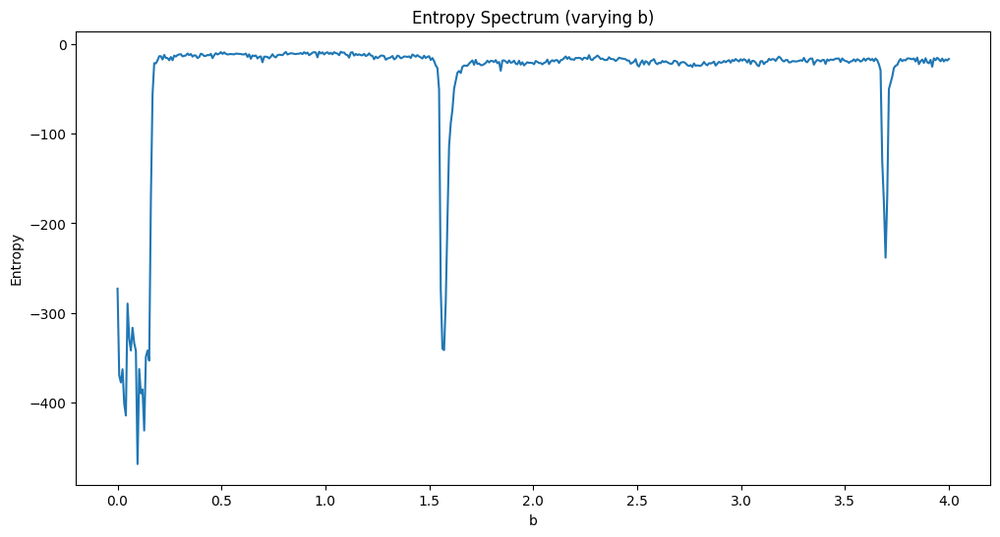

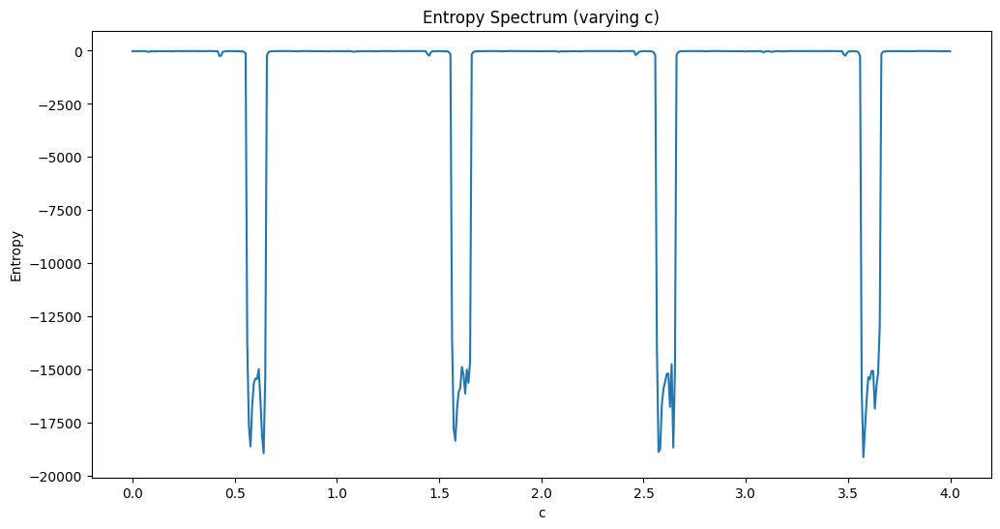

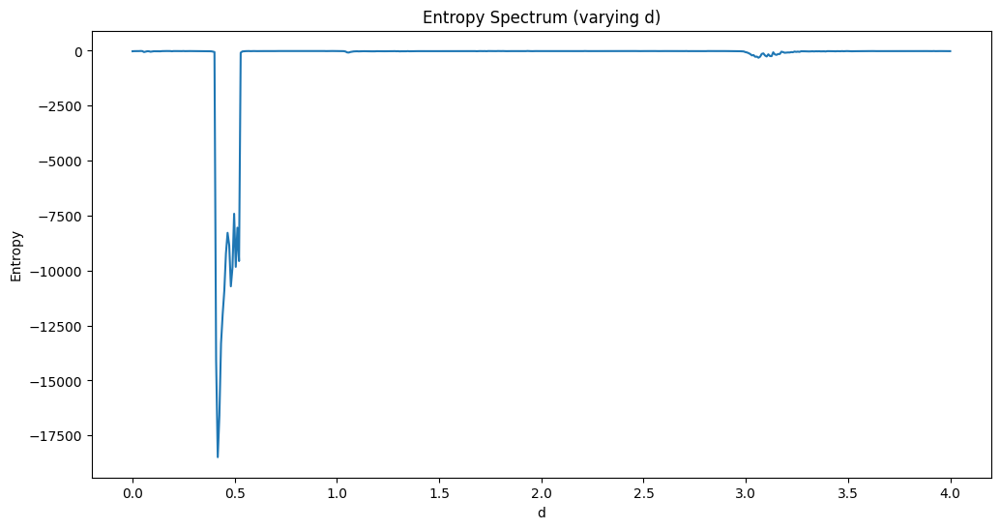

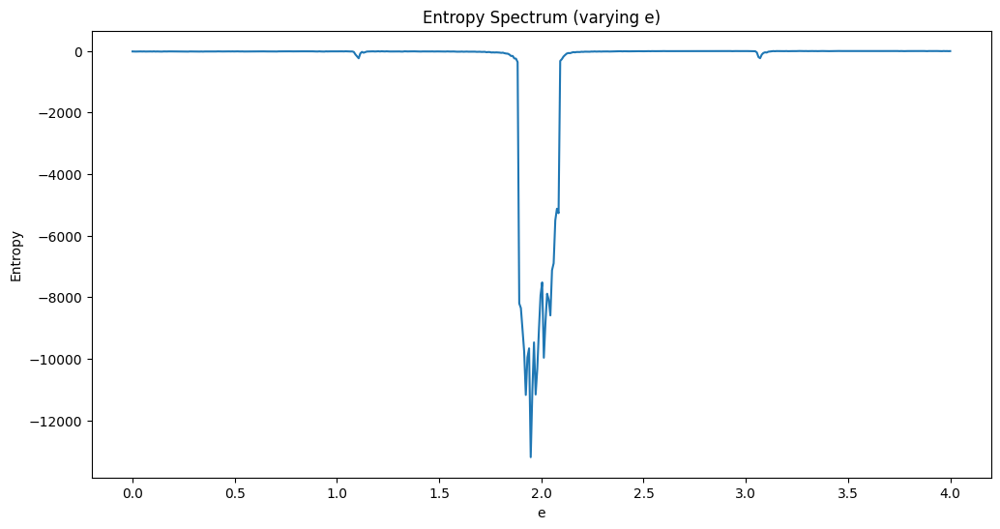

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def enhanced_complex_chaotic_map(x, a, b, c, d, e, f, g, h, xi, tau, eta):
    term1 = a * np.sin(np.pi * x**2)
    term2 = b * x * (1 - x**3)
    term3 = c * np.tanh(d * np.sqrt(abs(1 - x)))
    term4 = e * np.log(1 + abs(x))
    term5 = f * np.cos(g * np.pi * x)
    term6 = h * np.exp(-x**2)
    delay_term = xi * np.sin(np.pi * (x - tau))
    noise_term = eta * (2 * np.random.random() - 1)
    return (term1 + term2 + term3 + term4 + term5 + term6 + delay_term + noise_term) % 1

def plot_sequence(x0, params, n):
    x = x0
    x_vals = np.zeros(n)
    for i in range(n):
        x_vals[i] = x
        x = enhanced_complex_chaotic_map(x, *params)

    plt.figure(figsize=(12, 6))
    plt.plot(range(n), x_vals, 'b.', markersize=1)
    plt.title(f"Enhanced Complex Chaotic Map\n{params}")
    plt.xlabel("Iteration")
    plt.ylabel("x")
    plt.show()

def lyapunov_exponent(x0, params, n_iterations=10000, n_discard=1000):
    x = x0
    lyap = 0

    for _ in range(n_discard):
        x = enhanced_complex_chaotic_map(x, *params)

    for _ in range(n_iterations):
        x_new = enhanced_complex_chaotic_map(x, *params)
        dx = abs(enhanced_complex_chaotic_map(x + 1e-12, *params) - x_new)
        lyap += np.log(abs(dx / 1e-12))
        x = x_new

    return lyap / n_iterations

def entropy(x_vals, num_bins=100):
    hist, _ = np.histogram(x_vals, bins=num_bins, density=True)
    hist = hist[hist > 0]
    return -np.sum(hist * np.log(hist))

def plot_bifurcation(param_range, fixed_params, vary_param='a', n=1000, n_discard=100):
    plt.figure(figsize=(12, 8))
    param_vals = np.linspace(param_range[0], param_range[1], 1000)
    x_vals = np.zeros(n)
    idx = ['a', 'b', 'c', 'd', 'e', 'f', 'g', 'h', 'xi', 'tau', 'eta'].index(vary_param)

    for param in param_vals:
        x = 0.1
        params = list(fixed_params)
        params[idx] = param

        for _ in range(n_discard):
            x = enhanced_complex_chaotic_map(x, *params)

        for i in range(n):
            x = enhanced_complex_chaotic_map(x, *params)
            x_vals[i] = x

        plt.plot([param] * n, x_vals, ',k', alpha=0.1, markersize=0.1)

    plt.title(f"Bifurcation Diagram (varying {vary_param})")
    plt.xlabel(vary_param)
    plt.ylabel("x")
    plt.show()

def plot_lyapunov_spectrum(param_range, fixed_params, vary_param='a', n_points=500):
    param_vals = np.linspace(param_range[0], param_range[1], n_points)
    lyap_spectrum = np.zeros(n_points)
    idx = ['a', 'b', 'c', 'd', 'e', 'f', 'g', 'h', 'xi', 'tau', 'eta'].index(vary_param)

    for i, param in enumerate(param_vals):
        params = list(fixed_params)
        params[idx] = param
        lyap_spectrum[i] = lyapunov_exponent(0.1, params)

    plt.figure(figsize=(12, 6))
    plt.plot(param_vals, lyap_spectrum)
    plt.title(f"Lyapunov Spectrum (varying {vary_param})")
    plt.xlabel(vary_param)
    plt.ylabel("Lyapunov Exponent")
    plt.axhline(y=0, color='r', linestyle='--')
    plt.show()

def plot_entropy_spectrum(param_range, fixed_params, vary_param='a', n_points=500, n=1000):
    param_vals = np.linspace(param_range[0], param_range[1], n_points)
    entropy_spectrum = np.zeros(n_points)
    idx = ['a', 'b', 'c', 'd', 'e', 'f', 'g', 'h', 'xi', 'tau', 'eta'].index(vary_param)

    for i, param in enumerate(param_vals):
        x = 0.1
        params = list(fixed_params)
        params[idx] = param
        x_vals = np.zeros(n)

        for j in range(n):
            x = enhanced_complex_chaotic_map(x, *params)
            x_vals[j] = x

        entropy_spectrum[i] = entropy(x_vals)

    plt.figure(figsize=(12, 6))
    plt.plot(param_vals, entropy_spectrum)
    plt.title(f"Entropy Spectrum (varying {vary_param})")
    plt.xlabel(vary_param)
    plt.ylabel("Entropy")
    plt.show()

# Parameters
x0 = 0.1
params = (2.7, 3.8, 1.5, 4.0, 1.2, 0.8, 3.1, 0.5, 0.1, 0.05, 0.01)
n = 1000

# Plot the sequence
plot_sequence(x0, params, n)

# Calculate and print the Lyapunov exponent
lyap_exp = lyapunov_exponent(x0, params)
print(f"Lyapunov Exponent: {lyap_exp}")

# Calculate and print the entropy
x_vals = np.zeros(n)
x = x0
for i in range(n):
    x = enhanced_complex_chaotic_map(x, *params)
    x_vals[i] = x

entropy_value = entropy(x_vals)
print(f"Entropy: {entropy_value}")

# Plot bifurcation diagrams
plot_bifurcation((0, 4), params, vary_param='a')
plot_bifurcation((0, 4), params, vary_param='b')
plot_bifurcation((0, 4), params, vary_param='c')
plot_bifurcation((0, 4), params, vary_param='d')
plot_bifurcation((0, 4), params, vary_param='e')

# Plot Lyapunov spectra
plot_lyapunov_spectrum((0, 4), params, vary_param='a')
plot_lyapunov_spectrum((0, 4), params, vary_param='b')
plot_lyapunov_spectrum((0, 4), params, vary_param='c')
plot_lyapunov_spectrum((0, 4), params, vary_param='d')
plot_lyapunov_spectrum((0, 4), params, vary_param='e')

# Plot entropy spectra
plot_entropy_spectrum((0, 4), params, vary_param='a')
plot_entropy_spectrum((0, 4), params, vary_param='b')
plot_entropy_spectrum((0, 4), params, vary_param='c')
plot_entropy_spectrum((0, 4), params, vary_param='d')
plot_entropy_spectrum((0, 4), params, vary_param='e')


# Encrypting Image

Initial value (x0): 0.1

Parameters (params):

a = 2.7

b = 3.8

c = 1.5

d = 4.0

e = 1.2

f = 0.8

g = 3.1

h = 0.5

xi = 0.1

tau = 0.05

eta = 0.01


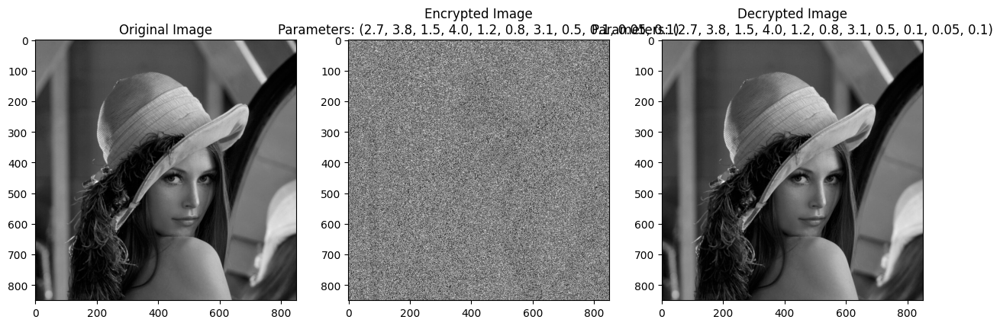

Decryption successful! The image has been correctly decrypted.


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Enhanced complex chaotic map function
def enhanced_complex_chaotic_map(x, a, b, c, d, e, f, g, h, xi, tau, eta):
    term1 = a * np.sin(np.pi * x**2)
    term2 = b * x * (1 - x**3)
    term3 = c * np.tanh(d * np.sqrt(abs(1 - x)))
    term4 = e * np.log(1 + abs(x))
    term5 = f * np.cos(g * np.pi * x)
    term6 = h * np.exp(-x**2)
    delay_term = xi * np.sin(np.pi * (x - tau))
    noise_term = eta * (2 * np.random.random() - 1)
    return (term1 + term2 + term3 + term4 + term5 + term6 + delay_term + noise_term) % 1

# Generate chaotic sequence
def generate_chaotic_sequence(length, x0, params, seed):
    np.random.seed(seed)
    x = x0
    seq = np.zeros(length)
    for i in range(length):
        x = enhanced_complex_chaotic_map(x, *params)
        seq[i] = x
    return seq

# Encrypt image
def encrypt_image(image, params, x0, seed):
    if len(image.shape) == 3:
        image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    flat_image = image.flatten()
    length = len(flat_image)

    chaotic_sequence = generate_chaotic_sequence(length, x0, params, seed)
    chaotic_sequence = (chaotic_sequence * 256).astype(np.uint8)

    encrypted_image = np.bitwise_xor(flat_image, chaotic_sequence)
    return encrypted_image.reshape(image.shape), chaotic_sequence

# Decrypt image
def decrypt_image(encrypted_image, params, x0, seed):
    flat_encrypted_image = encrypted_image.flatten()
    length = len(flat_encrypted_image)

    chaotic_sequence = generate_chaotic_sequence(length, x0, params, seed)
    chaotic_sequence = (chaotic_sequence * 256).astype(np.uint8)

    decrypted_image = np.bitwise_xor(flat_encrypted_image, chaotic_sequence)
    return decrypted_image.reshape(encrypted_image.shape)

# Parameters
x0 = 0.5
params = (2.7, 3.8, 1.5, 4.0, 1.2, 0.8, 3.1, 0.5, 0.1, 0.05, 0.1)
seed = 42  # Random seed for reproducibility

# Load image
image_path = 'image.png'
image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# Encrypt image
encrypted_image, encryption_sequence = encrypt_image(image, params, x0, seed)

# Decrypt image
decrypted_image = decrypt_image(encrypted_image, params, x0, seed)

# Display images with parameters
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.title("Original Image")
plt.imshow(image, cmap='gray')

plt.subplot(1, 3, 2)
plt.title(f"Encrypted Image\nParameters: {params}")
plt.imshow(encrypted_image, cmap='gray')

plt.subplot(1, 3, 3)
plt.title(f"Decrypted Image\nParameters: {params}")
plt.imshow(decrypted_image, cmap='gray')

plt.show()

# Verify encryption and decryption
if np.array_equal(image, decrypted_image):
    print("Decryption successful! The image has been correctly decrypted.")
else:
    print("Decryption failed! The decrypted image does not match the original image.")
    print(f"Chaotic sequence used for encryption:\n{encryption_sequence}")
    decryption_sequence = generate_chaotic_sequence(len(image.flatten()), x0, params, seed)
    decryption_sequence = (decryption_sequence * 256).astype(np.uint8)
    print(f"Chaotic sequence used for decryption:\n{decryption_sequence}")



In [ ]:
# Function to vary a single parameter and observe decryption
def vary_parameter_and_decrypt(image, original_params, param_index, param_range, x0, seed):
    varied_params = list(original_params)
    param_name = ['a', 'b', 'c', 'd', 'e', 'f', 'g', 'h', 'xi', 'tau', 'eta'][param_index]
    results = []

    for param_value in param_range:
        varied_params[param_index] = param_value

        # Encrypt with varied parameters
        encrypted_image, _ = encrypt_image(image, tuple(varied_params), x0=x0, seed=seed)

        # Decrypt with original parameters
        decrypted_image = decrypt_image(encrypted_image, tuple(original_params), x0=x0, seed=seed)

        # Check decryption result
        if np.array_equal(image, decrypted_image):
            results.append(1)
        else:
            results.append(0)

    plt.figure(figsize=(10, 6))
    plt.plot(param_range, results, marker='o')
    plt.title(f"Key Sensitivity: Variation in {param_name}")
    plt.xlabel(param_name)
    plt.ylabel("Decryption Success (1 = Success, 0 = Failure)")
    plt.grid(True)
    plt.show()

# Example: Varying parameter 'a' (index 0)
param_index = 0
param_range = np.linspace(params[param_index] - 0.5, params[param_index] + 0.5, 20)
vary_parameter_and_decrypt(image, list(params), param_index, param_range, x0, seed)

KeyboardInterrupt: 

#Trying Quantum with Chaos (not successful)

In [ ]:
!pip install qrng
!pip install qiskit==0.46
!pip install qiskit-ibmq-provider
!pip install qiskit-aer
!pip install qiskit-aer-q

ERROR: Could not find a version that satisfies the requirement qiskit-aer-q (from versions: none)
ERROR: No matching distribution found for qiskit-aer-q


In [ ]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import qiskit

# Sine map function
def sine_map(x, r):
    return r * np.sin(np.pi * x)

# Chaotic encryption using sine map
def chaotic_encrypt(data, r, iterations):
    x = np.random.random()  # Initial condition
    for _ in range(iterations):
        x = sine_map(x, r)

    encrypted = np.frombuffer(data.tobytes(), dtype=np.uint8)
    encrypted = encrypted ^ (x * 255).astype(np.uint8)
    return encrypted

# Chaotic decryption using sine map
def chaotic_decrypt(encrypted, r, iterations):
    x = np.random.random()  # Initial condition (should be the same as in encryption)
    for _ in range(iterations):
        x = sine_map(x, r)

    decrypted = encrypted ^ (x * 255).astype(np.uint8)
    return decrypted

# Quantum encryption/decryption
def quantum_process(data, key):
    n = len(data)
    qr = QuantumRegister(n)
    cr = ClassicalRegister(n)
    circuit = QuantumCircuit(qr, cr)

    # Encode the data into quantum states
    for i in range(n):
        if data[i]:
            circuit.x(qr[i])

    # Apply key-controlled operations
    for i in range(n):
        if key[i]:
            circuit.h(qr[i])  # Hadamard gate
            circuit.t(qr[i])  # T gate
        circuit.cx(qr[i], qr[(i+1)%n])  # CNOT gate with next qubit

    # Measure the qubits
    circuit.measure(qr, cr)

    # Execute the circuit
    backend = qiskit.BasicAer.get_backend('qasm_simulator')
    job = qiskit.execute(circuit, backend, shots=1)
    result = job.result().get_counts(circuit)

    # Get the result bitstring
    processed_data = list(result.keys())[0]
    return np.array([int(bit) for bit in processed_data])

# Full encryption process
def full_encrypt(image, r, iterations, quantum_key):
    chaotic_result = chaotic_encrypt(image, r, iterations)
    quantum_result = quantum_process(chaotic_result, quantum_key)
    return quantum_result

# Full decryption process
def full_decrypt(encrypted_data, r, iterations, quantum_key):
    quantum_decrypted = quantum_process(encrypted_data, quantum_key)
    chaotic_decrypted = chaotic_decrypt(quantum_decrypted, r, iterations)
    return chaotic_decrypted

# Load the image
image = Image.open('image.png').convert('L')  # Convert to grayscale
image_array = np.array(image)

# Set parameters
r = 0.9  # Parameter for sine map
iterations = 1000
quantum_key = np.random.randint(0, 2, size=image_array.size)  # Random binary key
print(quantum_key)

# Encrypt the image
encrypted_data = full_encrypt(image_array, r, iterations, quantum_key)

# Decrypt the image
decrypted_data = full_decrypt(encrypted_data, r, iterations, quantum_key)

# Reshape decrypted data back to image dimensions
decrypted_image = decrypted_data.reshape(image_array.shape)

# Display results
plt.figure(figsize=(15, 5))
plt.subplot(131)
plt.imshow(image_array, cmap='gray')
plt.title('Original Image')
plt.subplot(132)
plt.imshow(encrypted_data.reshape(image_array.shape), cmap='gray')
plt.title('Encrypted Image')
plt.subplot(133)
plt.imshow(decrypted_image, cmap='gray')
plt.title('Decrypted Image')
plt.show()

# Save the encrypted and decrypted images
Image.fromarray(encrypted_data.reshape(image_array.shape).astype(np.uint8)).save('encrypted.png')
Image.fromarray(decrypted_image.astype(np.uint8)).save('decrypted.png')

[0 1 1 ... 0 0 0]


<ipython-input-6-69ecf165ab92>:52: DeprecationWarning: BasicAer is deprecated since Qiskit 0.46 and will be removed in Qiskit 1.0. The BasicAer (qiskit.providers.basicaer) module has been superseded by  qiskit.providers.basic_provider, and all its classes have been renamed to follow a new naming convention. More information and migration guidelines can be found in the 0.46 API docs for BasicAer.
  backend = qiskit.BasicAer.get_backend('qasm_simulator')
<ipython-input-6-69ecf165ab92>:53: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = qiskit.execute(circuit, backend, shots=1)


BasicAerError: 'Number of qubits 722500 is greater than maximum (24) for "qasm_simulator".'

In [ ]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import qiskit

# Sine map function
def sine_map(x, r):
    return r * np.sin(np.pi * x)

# Chaotic encryption using sine map
def chaotic_encrypt(data, r, iterations):
    x = np.random.random()  # Initial condition
    for _ in range(iterations):
        x = sine_map(x, r)

    encrypted = np.frombuffer(data.tobytes(), dtype=np.uint8)
    encrypted = encrypted ^ (x * 255).astype(np.uint8)
    return encrypted

# Chaotic decryption using sine map
def chaotic_decrypt(encrypted, r, iterations):
    x = np.random.random()  # Initial condition (should be the same as in encryption)
    for _ in range(iterations):
        x = sine_map(x, r)

    decrypted = encrypted ^ (x * 255).astype(np.uint8)
    return decrypted

# Quantum encryption/decryption
def quantum_process(data, key):
    chunk_size = 24  # Process in 24-qubit chunks
    processed_data = []

    for i in range(0, len(data), chunk_size):
        chunk = data[i:i+chunk_size]
        chunk_key = key[i:i+chunk_size]

        n = len(chunk)
        qr = qiskit.QuantumRegister(n)
        cr = qiskit.ClassicalRegister(n)
        circuit = qiskit.QuantumCircuit(qr, cr)

        # Encode the data into quantum states
        for j in range(n):
            if chunk[j]:
                circuit.x(qr[j])

        # Apply key-controlled operations
        for j in range(n):
            if chunk_key[j]:
                circuit.h(qr[j])  # Hadamard gate
                circuit.t(qr[j])  # T gate
            circuit.cx(qr[j], qr[(j+1)%n])  # CNOT gate with next qubit

        # Measure the qubits
        circuit.measure(qr, cr)

        # Execute the circuit
        backend = qiskit.BasicAer.get_backend('qasm_simulator')
        job = qiskit.execute(circuit, backend, shots=1)
        result = job.result().get_counts(circuit)

        # Get the result bitstring
        processed_chunk = list(result.keys())[0]
        processed_data.extend([int(bit) for bit in processed_chunk])

    return np.array(processed_data)

# Full encryption process
def full_encrypt(image, r, iterations, quantum_key):
    chaotic_result = chaotic_encrypt(image, r, iterations)
    quantum_result = quantum_process(chaotic_result, quantum_key)
    return quantum_result

# Full decryption process
def full_decrypt(encrypted_data, r, iterations, quantum_key):
    quantum_decrypted = quantum_process(encrypted_data, quantum_key)
    chaotic_decrypted = chaotic_decrypt(quantum_decrypted, r, iterations)
    return chaotic_decrypted

# Load the image
image = Image.open('8bit.png').convert('L')  # Convert to grayscale
image_array = np.array(image)

# Set parameters
r = 0.9  # Parameter for sine map
iterations = 1000
quantum_key = np.random.randint(0, 2, size=image_array.size)  # Random binary key
print(quantum_key)

# Encrypt the image
encrypted_data = full_encrypt(image_array, r, iterations, quantum_key)

# Decrypt the image
decrypted_data = full_decrypt(encrypted_data, r, iterations, quantum_key)

# Reshape decrypted data back to image dimensions
decrypted_image = decrypted_data.reshape(image_array.shape)

# Display results
plt.figure(figsize=(15, 5))
plt.subplot(131)
plt.imshow(image_array, cmap='gray')
plt.title('Original Image')
plt.subplot(132)
plt.imshow(encrypted_data.reshape(image_array.shape), cmap='gray')
plt.title('Encrypted Image')
plt.subplot(133)
plt.imshow(decrypted_image, cmap='gray')
plt.title('Decrypted Image')
plt.show()

# Save the encrypted and decrypted images
Image.fromarray(encrypted_data.reshape(image_array.shape).astype(np.uint8)).save('encrypted.png')
Image.fromarray(decrypted_image.astype(np.uint8)).save('decrypted.png')

[1 1 1 ... 1 0 1]


<ipython-input-2-0e97dc6058a4>:59: DeprecationWarning: BasicAer is deprecated since Qiskit 0.46 and will be removed in Qiskit 1.0. The BasicAer (qiskit.providers.basicaer) module has been superseded by  qiskit.providers.basic_provider, and all its classes have been renamed to follow a new naming convention. More information and migration guidelines can be found in the 0.46 API docs for BasicAer.
  backend = qiskit.BasicAer.get_backend('qasm_simulator')
<ipython-input-2-0e97dc6058a4>:60: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = qiskit.execute(circuit, backend, shots=1)
<ipython-input-2-0e97dc6058a4>:59: DeprecationWarning: BasicAer is deprecated since Qiskit 0.46 and will be

In [ ]:
import qrng
qrng.set_provider_as_IBMQ('5fc76df40440fd2673764a14a9908826d9648bf10c88d0149968cc187e729bcc45514d24e347f60f16959064c3172081f0582de7b7b10f0a480f805c174f31fd') #the IBMQ API token from your dashboard
qrng.set_backend('ibm_kyoto')
qrng.get_random_float(0,1)

ModuleNotFoundError: No module named 'qrng'

<ipython-input-1-a266a827eace>:52: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string ",k" (-> color='k'). The keyword argument will take precedence.
  plt.plot(r_values, x_values, ',k', alpha=0.1, markersize=0.1, color='white')


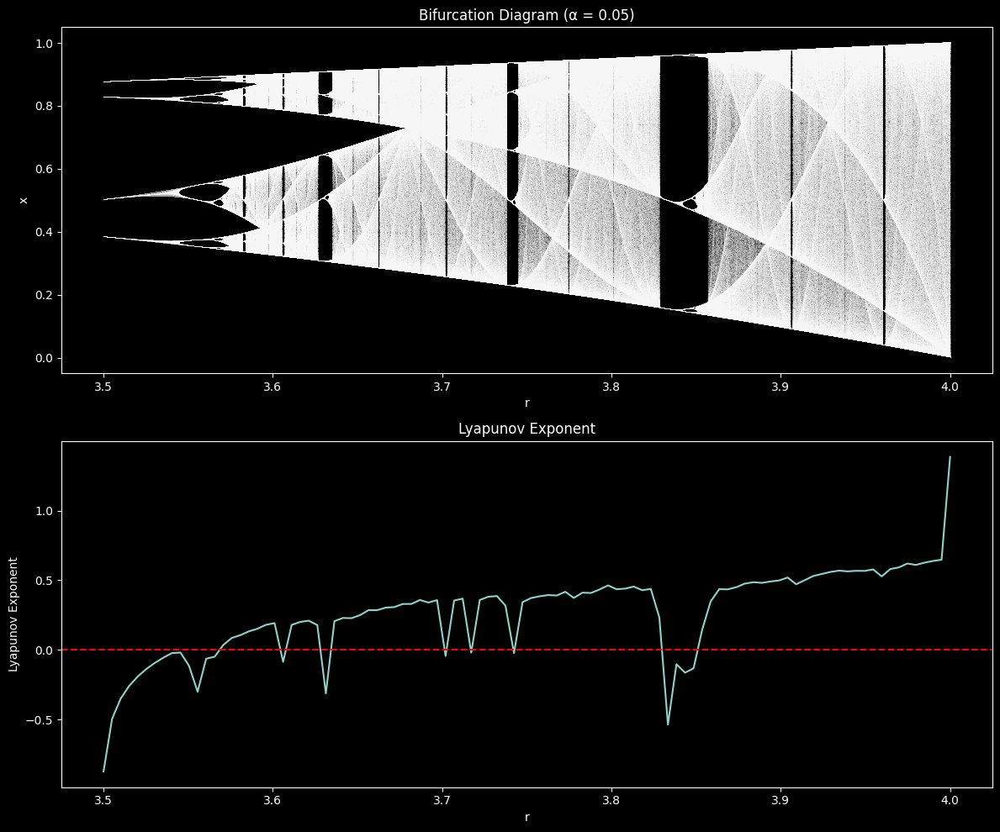

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def quantum_random():
    return np.random.random()

def quantum_logistic_map(x, r, alpha):
    return r * x * (1 - x)

def generate_bifurcation_data(r_min, r_max, num_r, num_iterations, num_discard, alpha):
    r_range = np.linspace(r_min, r_max, num_r)
    x_values = []
    for r in r_range:
        x = 0.5
        for _ in range(num_discard):  # Discard initial transients
            x = quantum_logistic_map(x, r, alpha)
        for _ in range(num_iterations):
            x = quantum_logistic_map(x, r, alpha)
            x_values.append((r, x))
    return x_values

def lyapunov_exponent(r, alpha, num_iterations, num_discard):
    x = 0.5
    lyap = 0
    for _ in range(num_discard):
        x = quantum_logistic_map(x, r, alpha)
    for _ in range(num_iterations):
        x_new = quantum_logistic_map(x, r, alpha)
        lyap += np.log(abs(r * (1 - 2*x)))
        x = x_new
    return lyap / num_iterations

r_min, r_max = 3.5, 4.0
num_r = 10000
num_iterations = 1000
num_discard = 1
alpha = 0.05

# bifurcation data
bifurcation_data = generate_bifurcation_data(r_min, r_max, num_r, num_iterations, num_discard, alpha)

# Lyapunov exponents
r_range = np.linspace(r_min, r_max, 100)
lyap_exponents = [lyapunov_exponent(r, alpha, num_iterations, num_discard) for r in r_range]

plt.style.use('dark_background')

#Bifurcation Diagram
plt.figure(figsize=(12, 10))
plt.subplot(211)
r_values, x_values = zip(*bifurcation_data)
plt.plot(r_values, x_values, ',k', alpha=0.1, markersize=0.1, color='white')
plt.title(f'Bifurcation Diagram (α = {alpha})')
plt.xlabel('r')
plt.ylabel('x')

#Lyapunov Exponent
plt.subplot(212)
plt.plot(r_range, lyap_exponents)
plt.title('Lyapunov Exponent')
plt.xlabel('r')
plt.ylabel('Lyapunov Exponent')
plt.axhline(y=0, color='r', linestyle='--')

plt.tight_layout()
plt.show()

<ipython-input-9-cf4c425ea096>:16: RuntimeWarning: overflow encountered in double_scalars
  return r * x * (1 - x) + np.sin(np.pi * x) * q
<ipython-input-9-cf4c425ea096>:16: RuntimeWarning: invalid value encountered in sin
  return r * x * (1 - x) + np.sin(np.pi * x) * q
<ipython-input-9-cf4c425ea096>:32: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string ",k" (-> color='k'). The keyword argument will take precedence.
  plt.plot(r_plot, x_values, ',k', alpha=0.25, color='white')


IndexError: index 0 is out of bounds for axis 0 with size 0

<Figure size 1000x700 with 1 Axes>

<ipython-input-9-cf4c425ea096>:44: RuntimeWarning: invalid value encountered in cos
  derivative = r * (1 - 2 * x) + np.pi * np.cos(np.pi * x) * q


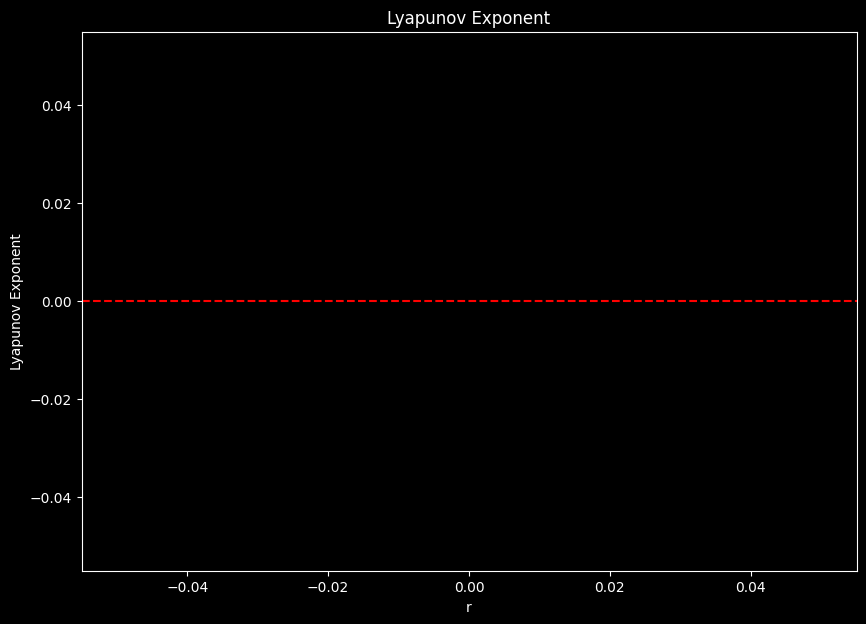

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Parameters
num_iterations = 100
last_iterations = 100
r_values = np.linspace(3.5, 4, 100)
x0 = 0.5

# Quantum random number generator (QRNG)
def qrng():
    return np.random.uniform(-1, 1)

# New chaotic map
def chaotic_map(x, r, q):
    return r * x * (1 - x) + np.sin(np.pi * x) * q

# Bifurcation diagram
x_values = []
r_plot = []

for r in r_values:
    x = x0
    for _ in range(num_iterations - last_iterations):
        x = chaotic_map(x, r, qrng())
    for _ in range(last_iterations):
        x = chaotic_map(x, r, qrng())
        r_plot.append(r)
        x_values.append(x)

plt.figure(figsize=(10, 7))
plt.plot(r_plot, x_values, ',k', alpha=0.25, color='white')
plt.title("Bifurcation Diagram")
plt.xlabel("r")
plt.ylabel("x")
plt.show()

def lyapunov_exponent(r, x0, num_iterations):
    x = x0
    lyapunov_sum = 0
    for _ in range(num_iterations):
        q = qrng()
        x_new = chaotic_map(x, r, q)
        derivative = r * (1 - 2 * x) + np.pi * np.cos(np.pi * x) * q
        if derivative == 0:
            derivative = 1e-10  # avoid log(0)
        lyapunov_sum += np.log(abs(derivative))
        x = x_new
    return lyapunov_sum / num_iterations

# Lyapunov exponent for different r values
lyapunov_exponents = [lyapunov_exponent(r, x0, num_iterations) for r in r_values]

plt.figure(figsize=(10, 7))
plt.plot(r_values, lyapunov_exponents, 'b')
plt.axhline(0, color='r', linestyle='--')
plt.title("Lyapunov Exponent")
plt.xlabel("r")
plt.ylabel("Lyapunov Exponent")
plt.show()


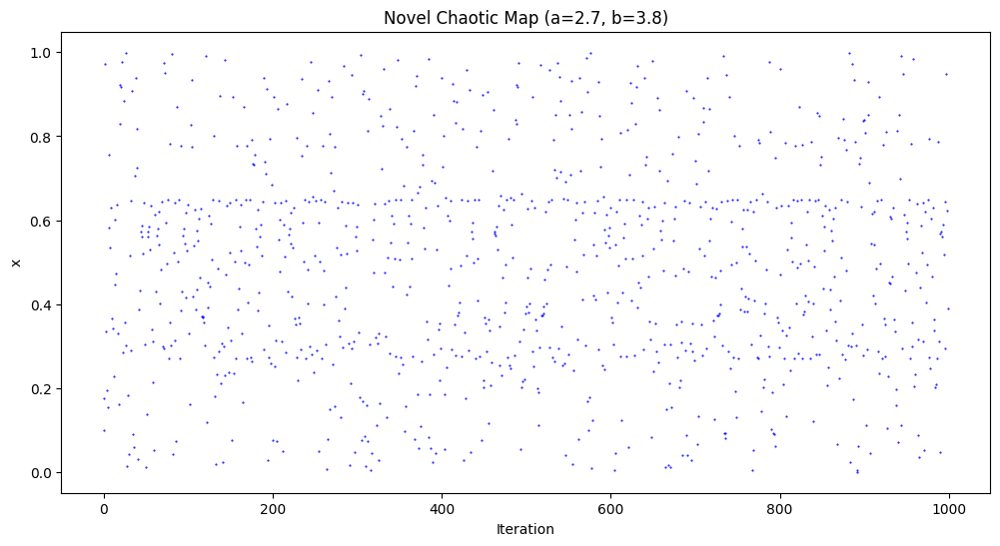

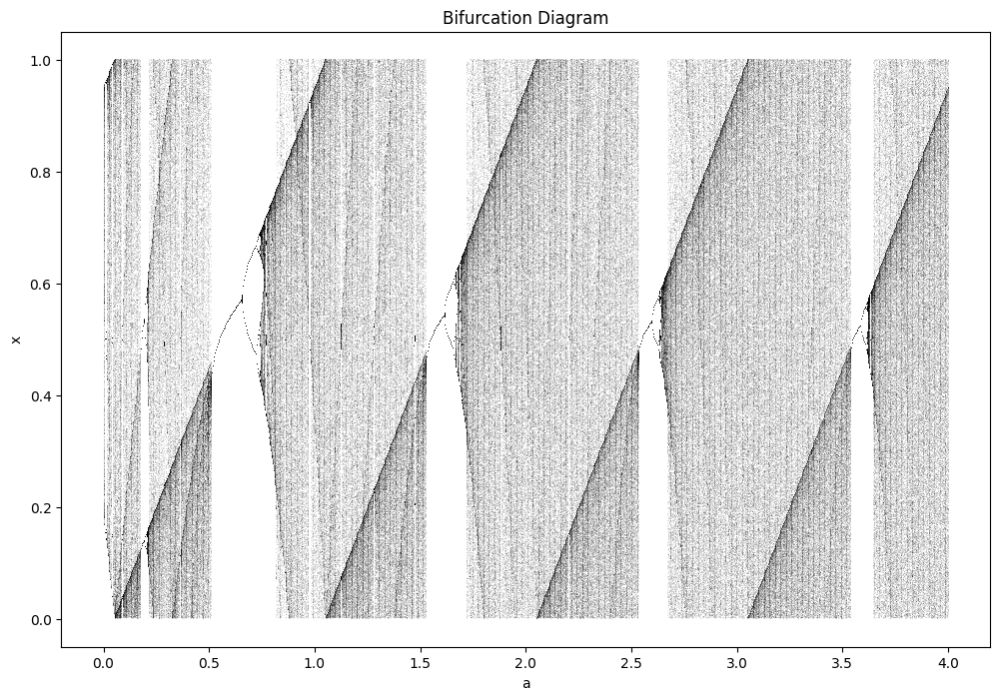

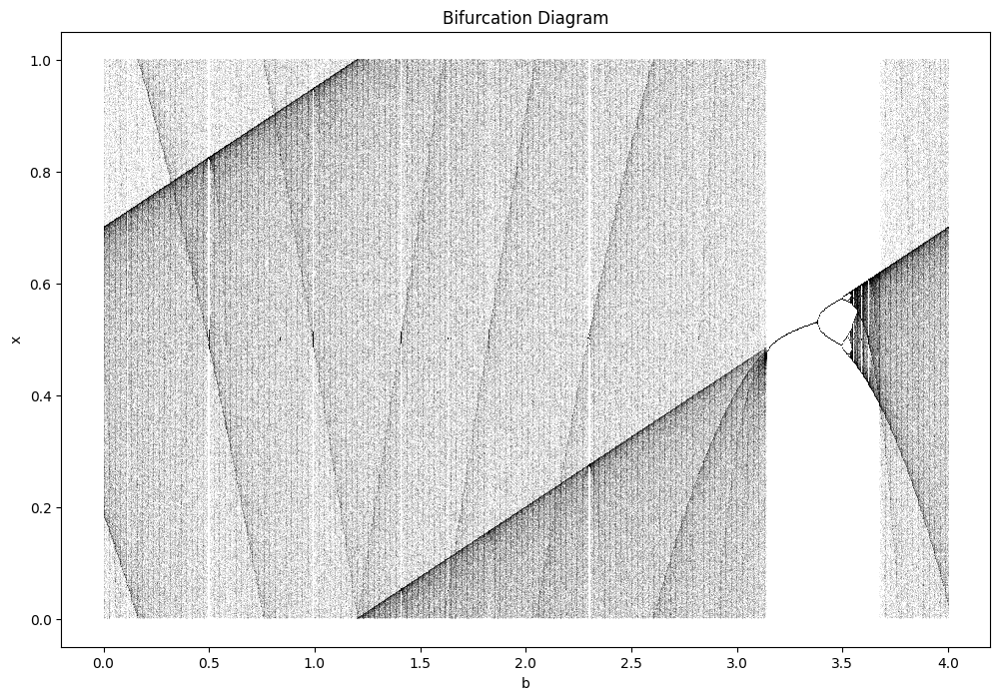

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def novel_chaotic_map(x, a, b):
    return (a * np.sin(np.pi * x) + b * x * (1 - x)) % 1

def plot_sequence(x0, a, b, n):
    x = x0
    plt.figure(figsize=(12, 6))
    for i in range(n):
        plt.plot(i, x, 'b.', markersize=1)
        x = novel_chaotic_map(x, a, b)
    plt.title(f"Novel Chaotic Map (a={a}, b={b})")
    plt.xlabel("Iteration")
    plt.ylabel("x")
    plt.show()

def plot_bifurcation(param_range, fixed_param, vary_a=True, n=1000, n_discard=100):
    plt.figure(figsize=(12, 8))
    for param in np.linspace(param_range[0], param_range[1], 1000):
        x = 0.1
        a, b = (param, fixed_param) if vary_a else (fixed_param, param)

        # Discard initial transients
        for _ in range(n_discard):
            x = novel_chaotic_map(x, a, b)

        # Plot points
        y = np.empty(n)
        for i in range(n):
            x = novel_chaotic_map(x, a, b)
            y[i] = x
        plt.plot([param] * n, y, ',k', alpha=0.1, markersize=0.1)

    plt.title("Bifurcation Diagram")
    plt.xlabel("a" if vary_a else "b")
    plt.ylabel("x")
    plt.show()

# Parameters
x0 = 0.1  # Initial condition
a = 2.7   # Control parameter
b = 3.8   # Control parameter
n = 1000  # Number of iterations

# Plot the sequence
plot_sequence(x0, a, b, n)

# Plot bifurcation diagram varying 'a'
plot_bifurcation((0, 4), fixed_param=3.8, vary_a=True)

# Plot bifurcation diagram varying 'b'
plot_bifurcation((0, 4), fixed_param=2.7, vary_a=False)

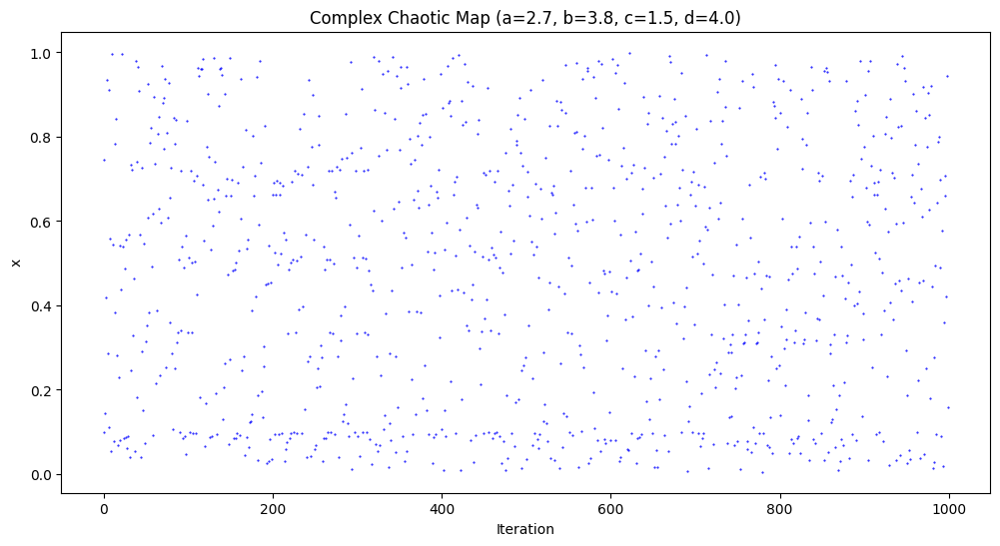

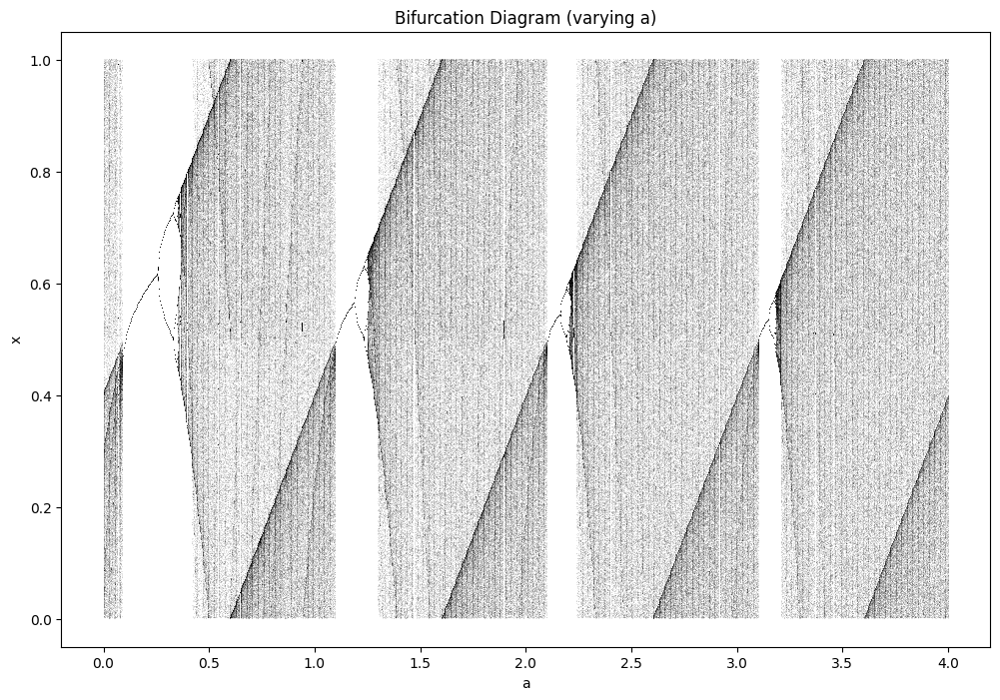

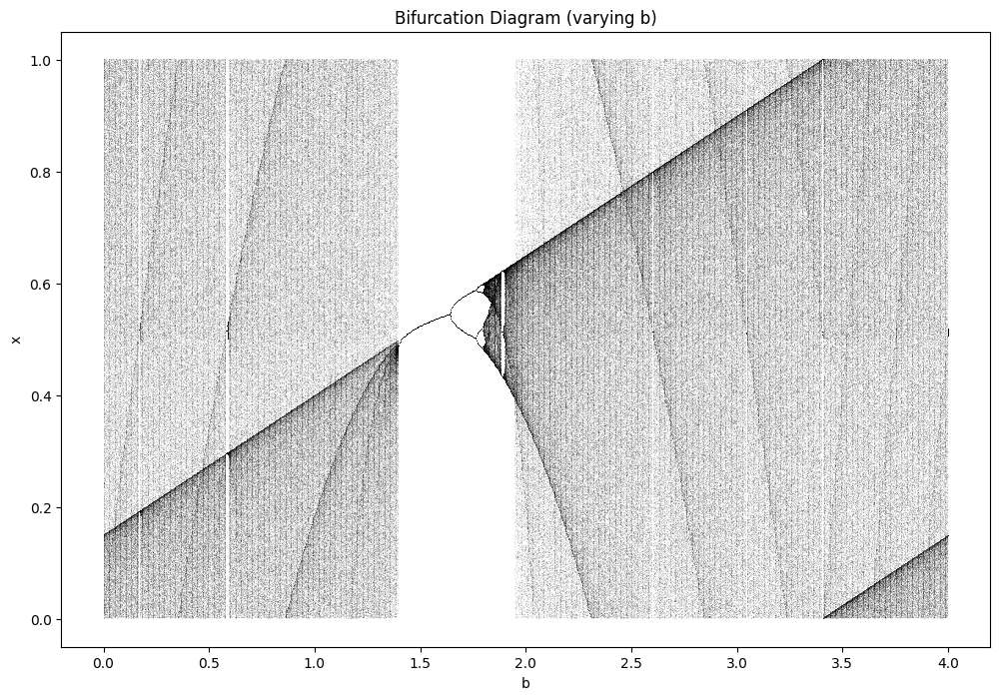

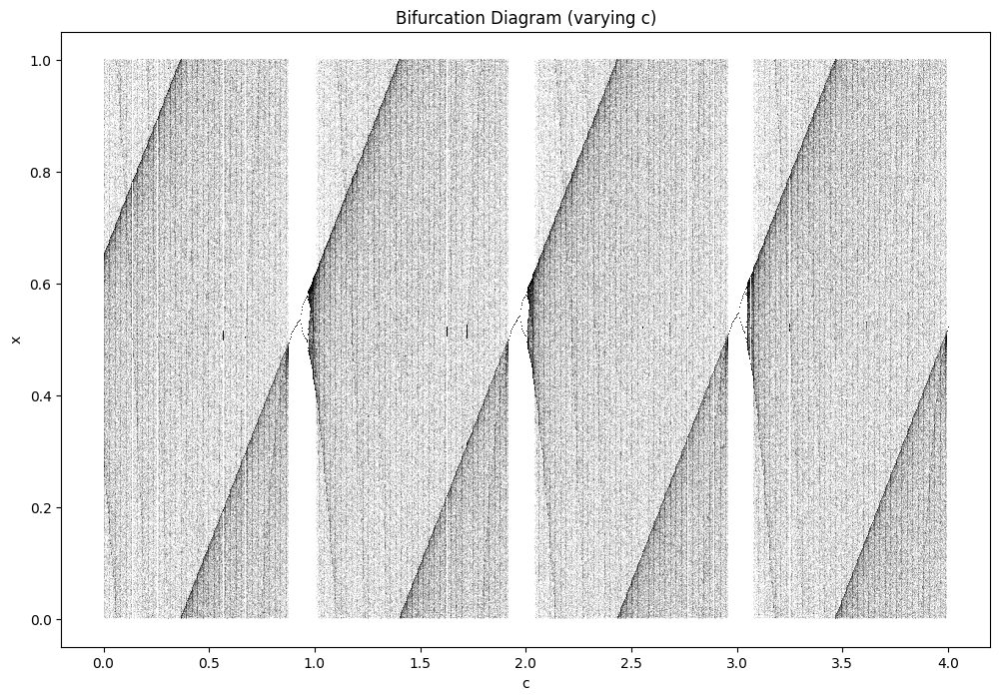

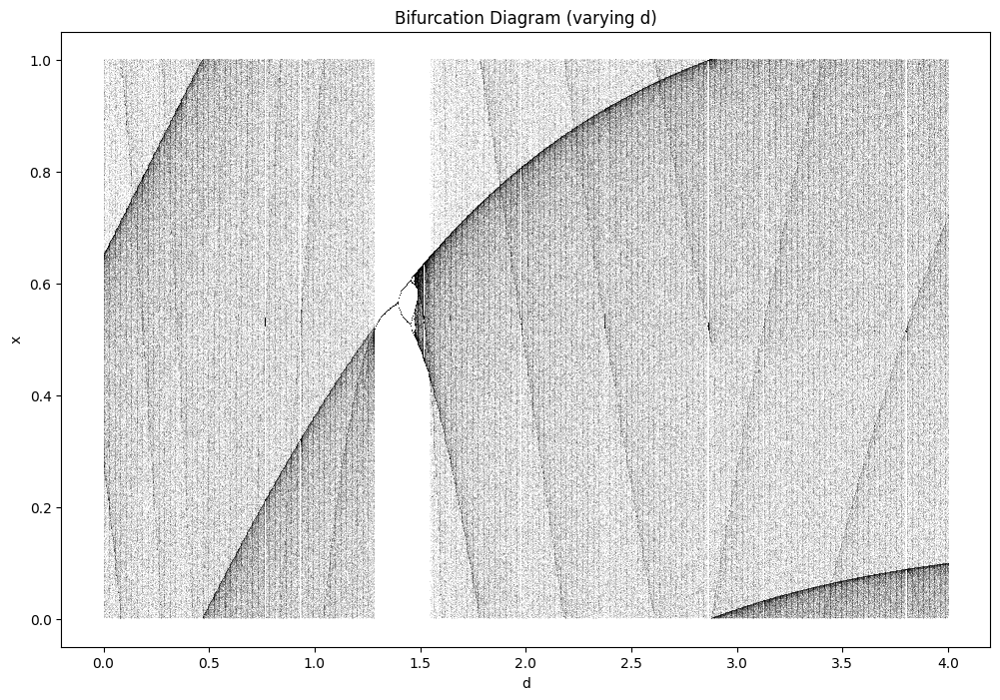

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def novel_complex_chaotic_map(x, a, b, c, d):
    return (a * np.sin(np.pi * x) + b * x * (1 - x) + c * np.tanh(d * x)) % 1

def plot_sequence(x0, a, b, c, d, n):
    x = x0
    plt.figure(figsize=(12, 6))
    for i in range(n):
        plt.plot(i, x, 'b.', markersize=1)
        x = novel_complex_chaotic_map(x, a, b, c, d)
    plt.title(f"Complex Chaotic Map (a={a}, b={b}, c={c}, d={d})")
    plt.xlabel("Iteration")
    plt.ylabel("x")
    plt.show()

def plot_bifurcation(param_range, fixed_params, vary_param='a', n=1000, n_discard=100):
    plt.figure(figsize=(12, 8))
    for param in np.linspace(param_range[0], param_range[1], 1000):
        x = 0.1
        params = list(fixed_params)
        params[['a', 'b', 'c', 'd'].index(vary_param)] = param

        # Discard initial transients
        for _ in range(n_discard):
            x = novel_complex_chaotic_map(x, *params)

        # Plot points
        y = np.empty(n)
        for i in range(n):
            x = novel_complex_chaotic_map(x, *params)
            y[i] = x
        plt.plot([param] * n, y, ',k', alpha=0.1, markersize=0.1)

    plt.title(f"Bifurcation Diagram (varying {vary_param})")
    plt.xlabel(vary_param)
    plt.ylabel("x")
    plt.show()

# Parameters
x0 = 0.1  # Initial condition
a = 2.7   # Control parameter
b = 3.8   # Control parameter
c = 1.5   # New control parameter
d = 4.0   # New control parameter
n = 1000  # Number of iterations

# Plot the sequence
plot_sequence(x0, a, b, c, d, n)

# Plot bifurcation diagrams
plot_bifurcation((0, 4), (a, b, c, d), vary_param='a')
plot_bifurcation((0, 4), (a, b, c, d), vary_param='b')
plot_bifurcation((0, 4), (a, b, c, d), vary_param='c')
plot_bifurcation((0, 4), (a, b, c, d), vary_param='d')

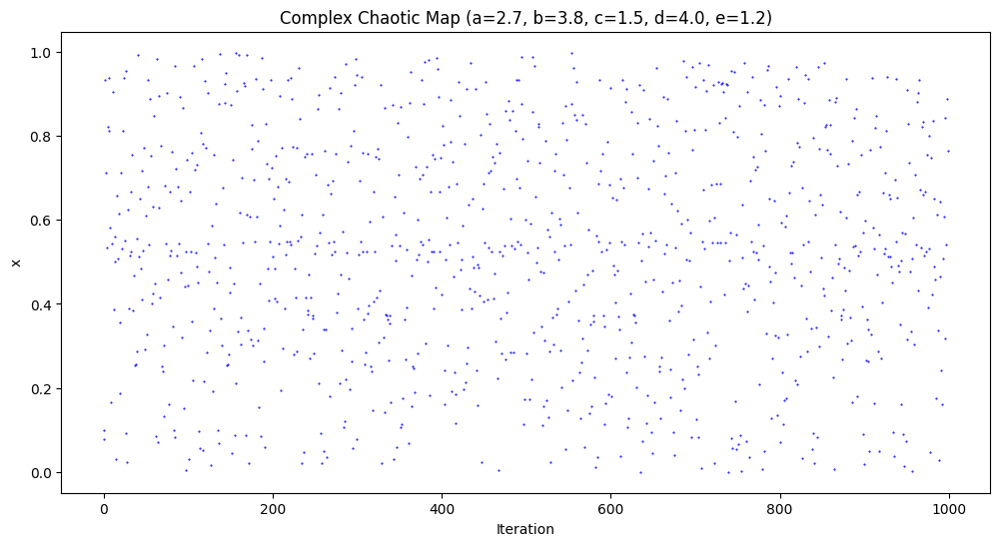

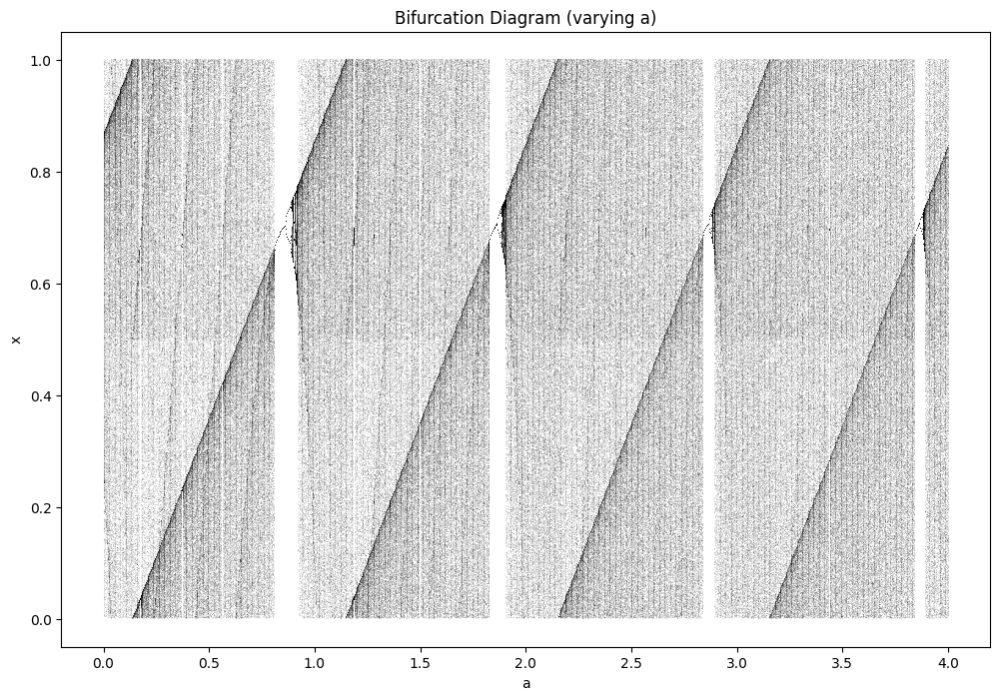

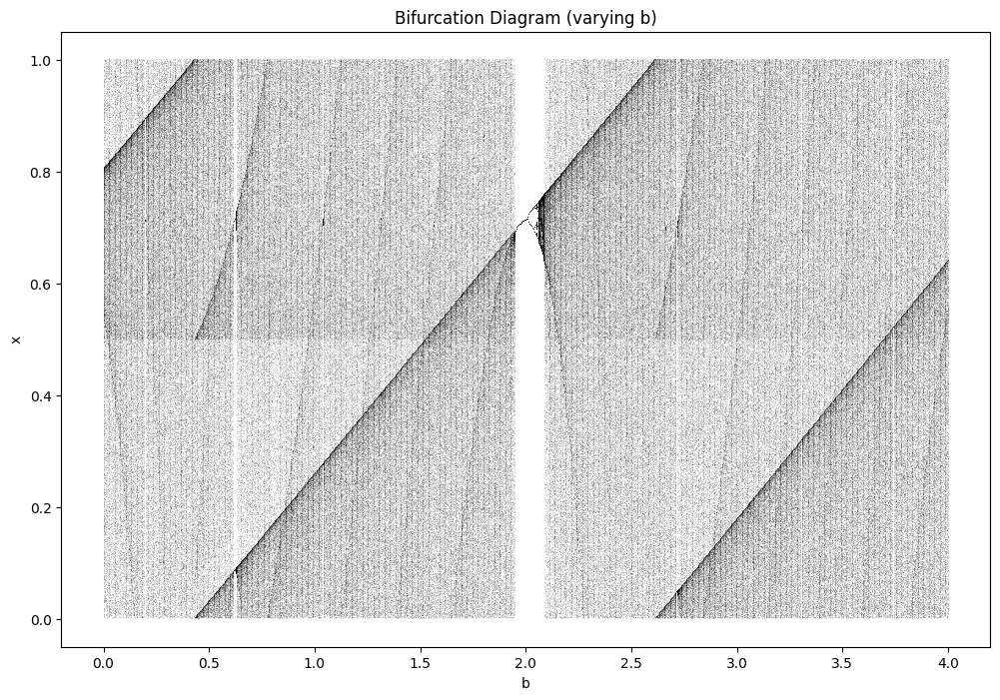

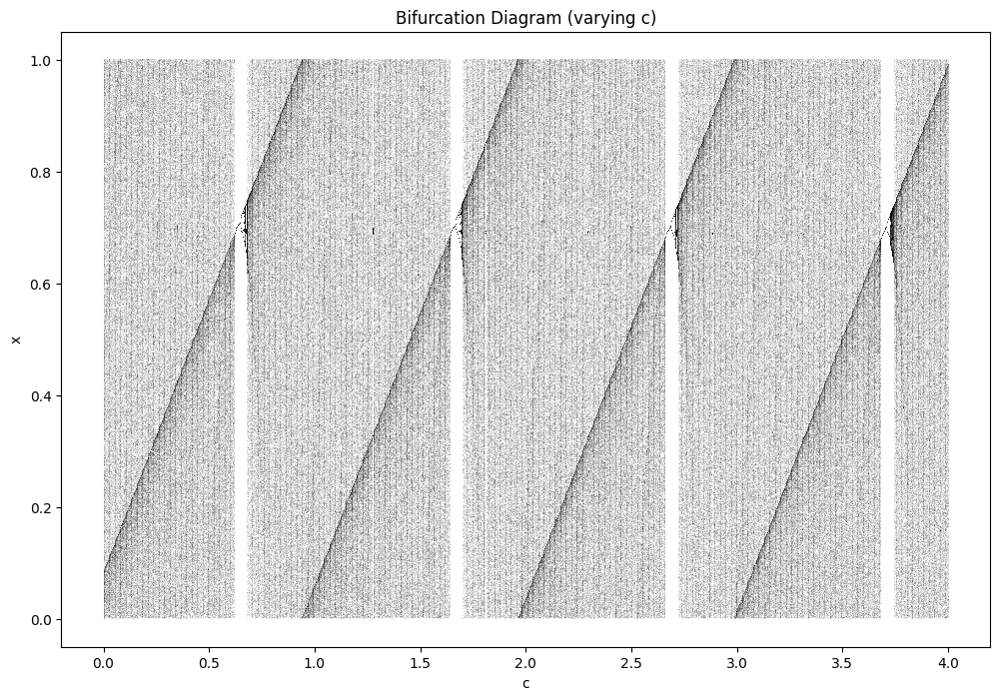

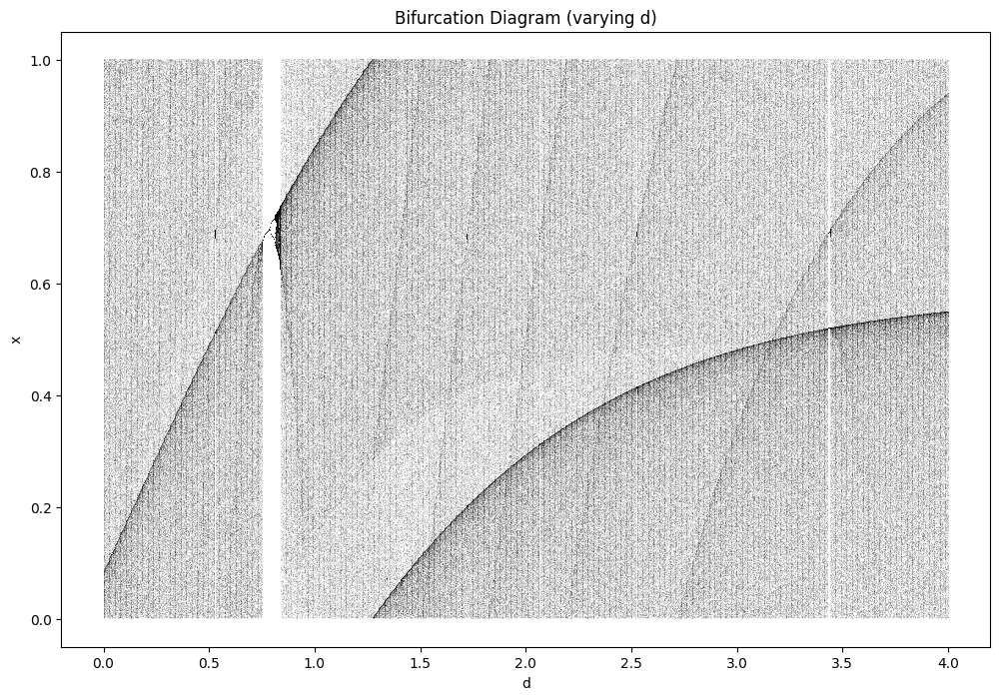

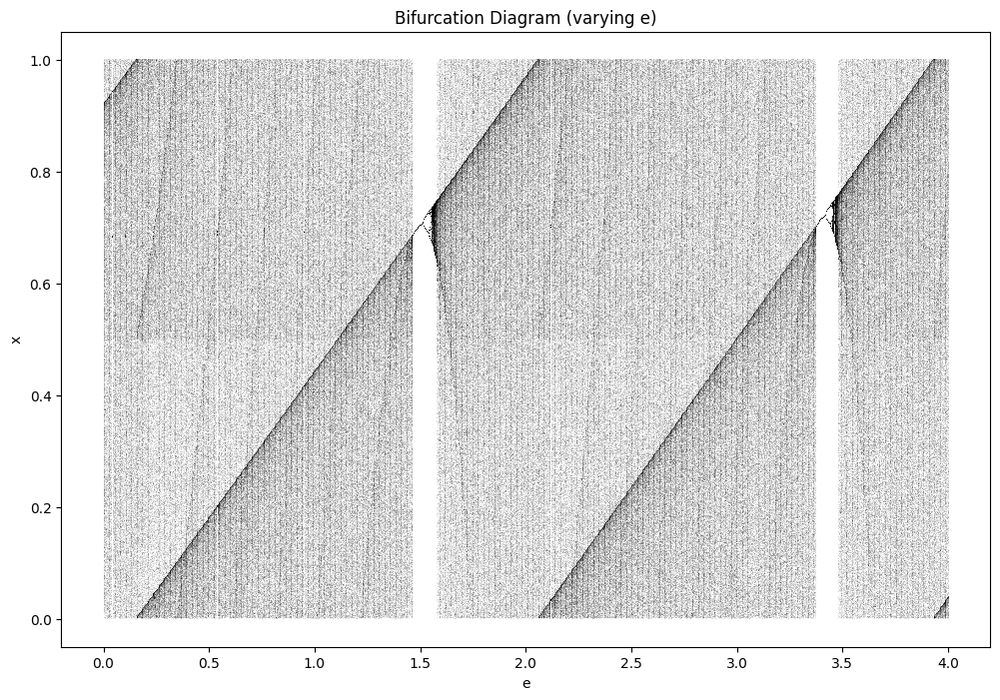

<ipython-input-3-f7ab52638e7b>:53: RuntimeWarning: divide by zero encountered in log
  lyap += np.log(abs(dx / 1e-12))


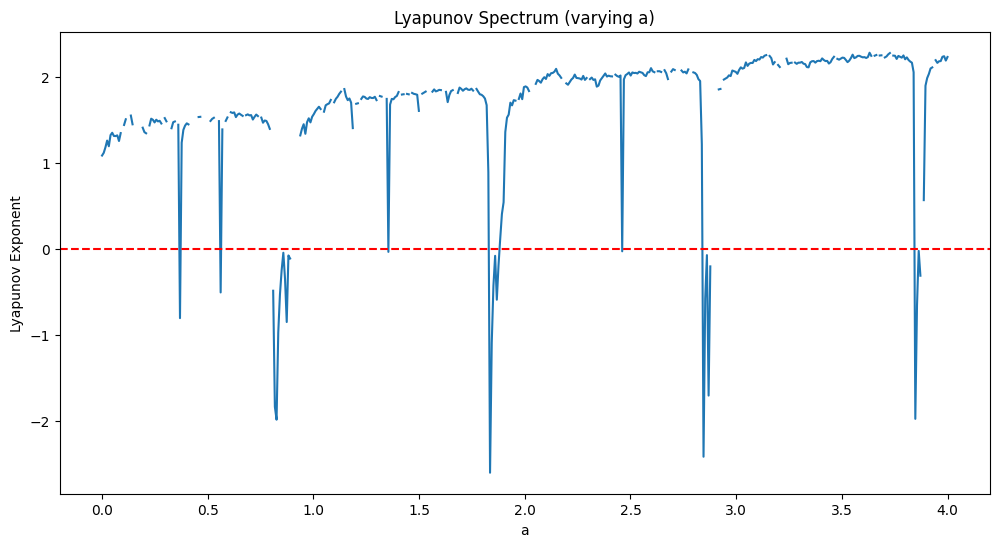

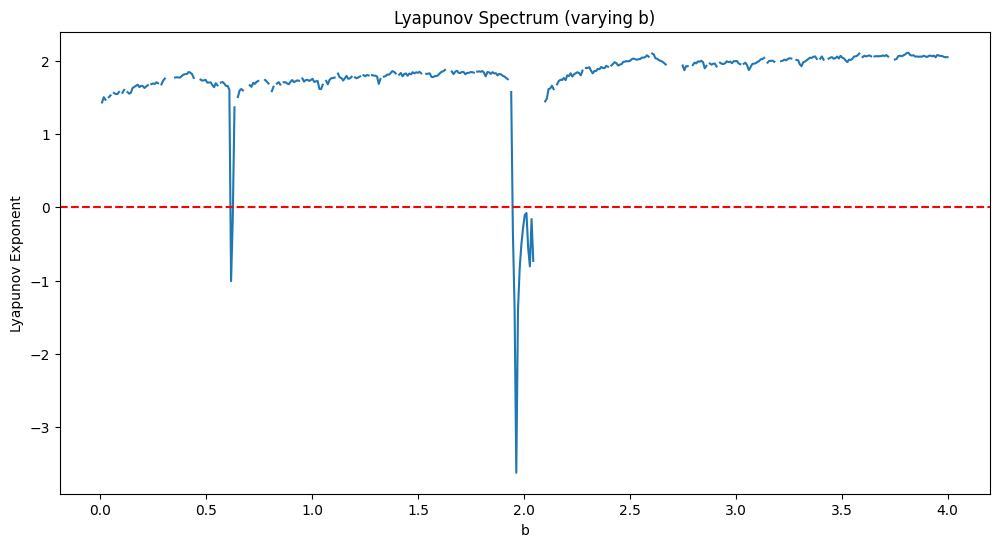

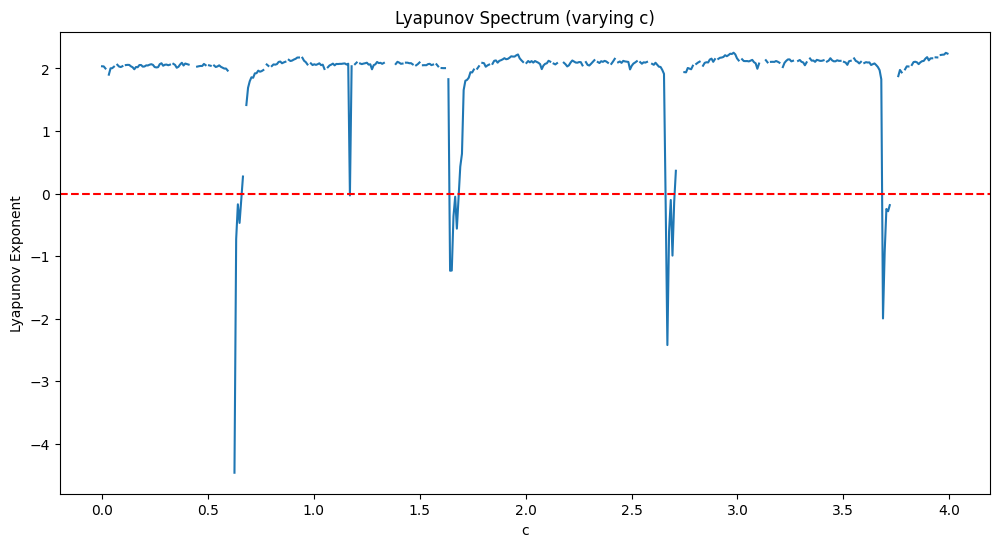

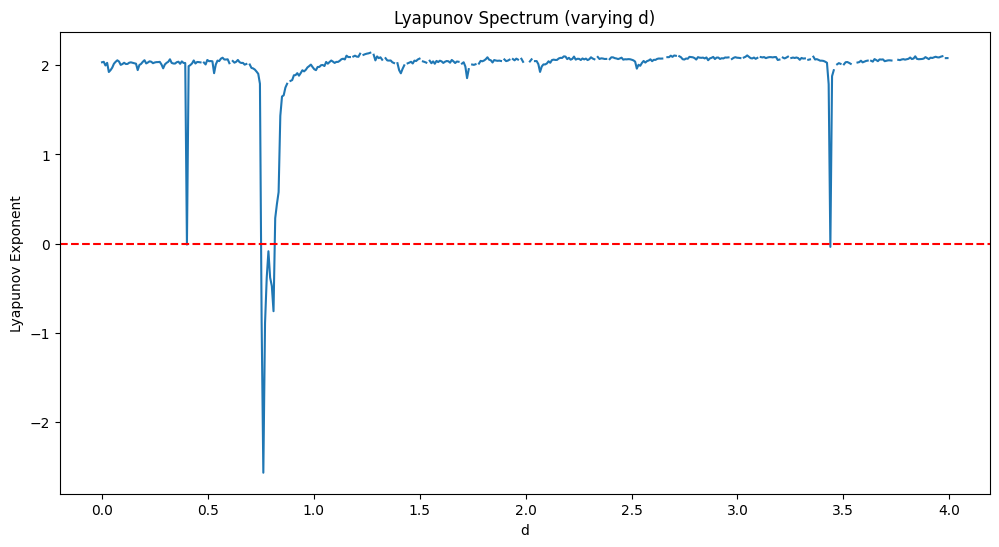

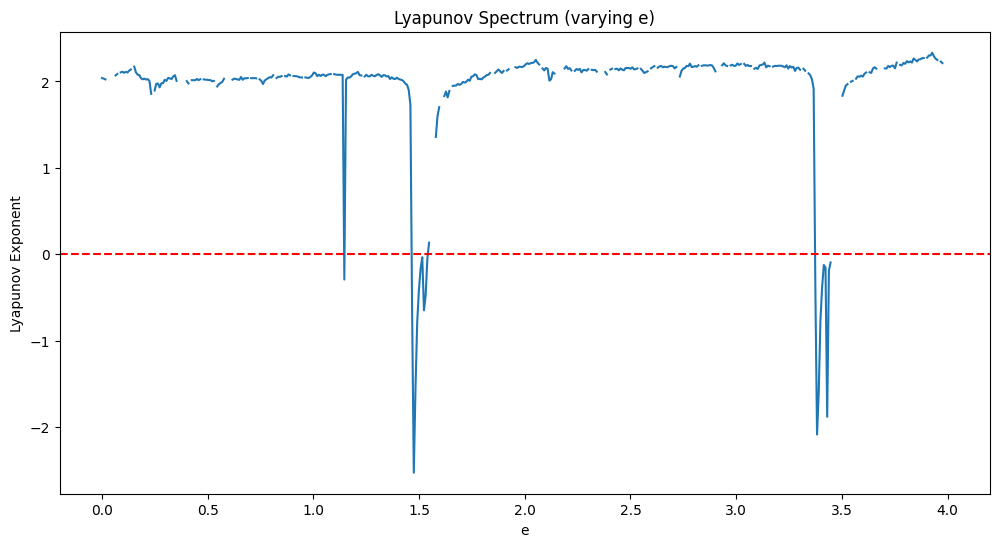

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def novel_complex_chaotic_map(x, a, b, c, d, e):
    term1 = a * np.sin(np.pi * x**2)
    term2 = b * x * (1 - x**3)
    term3 = c * np.tanh(d * np.sqrt(abs(1 - x)))
    term4 = e * np.log(1 + abs(x))
    return (term1 + term2 + term3 + term4) % 1

def plot_sequence(x0, a, b, c, d, e, n):
    x = x0
    plt.figure(figsize=(12, 6))
    for i in range(n):
        plt.plot(i, x, 'b.', markersize=1)
        x = novel_complex_chaotic_map(x, a, b, c, d, e)
    plt.title(f"Complex Chaotic Map (a={a}, b={b}, c={c}, d={d}, e={e})")
    plt.xlabel("Iteration")
    plt.ylabel("x")
    plt.show()

def plot_bifurcation(param_range, fixed_params, vary_param='a', n=1000, n_discard=100):
    plt.figure(figsize=(12, 8))
    for param in np.linspace(param_range[0], param_range[1], 1000):
        x = 0.1
        params = list(fixed_params)
        params[['a', 'b', 'c', 'd', 'e'].index(vary_param)] = param

        for _ in range(n_discard):
            x = novel_complex_chaotic_map(x, *params)

        y = np.empty(n)
        for i in range(n):
            x = novel_complex_chaotic_map(x, *params)
            y[i] = x
        plt.plot([param] * n, y, ',k', alpha=0.1, markersize=0.1)

    plt.title(f"Bifurcation Diagram (varying {vary_param})")
    plt.xlabel(vary_param)
    plt.ylabel("x")
    plt.show()

def lyapunov_exponent(x0, a, b, c, d, e, n_iterations=10000, n_discard=1000):
    x = x0
    lyap = 0

    for _ in range(n_discard):
        x = novel_complex_chaotic_map(x, a, b, c, d, e)

    for _ in range(n_iterations):
        x_new = novel_complex_chaotic_map(x, a, b, c, d, e)
        dx = abs(novel_complex_chaotic_map(x + 1e-12, a, b, c, d, e) - x_new)
        lyap += np.log(abs(dx / 1e-12))
        x = x_new

    return lyap / n_iterations

def plot_lyapunov_spectrum(param_range, fixed_params, vary_param='a', n_points=500):
    params = np.linspace(param_range[0], param_range[1], n_points)
    lyap_spectrum = np.zeros(n_points)

    for i, param in enumerate(params):
        params_list = list(fixed_params)
        params_list[['a', 'b', 'c', 'd', 'e'].index(vary_param)] = param
        lyap_spectrum[i] = lyapunov_exponent(0.1, *params_list)

    plt.figure(figsize=(12, 6))
    plt.plot(params, lyap_spectrum)
    plt.title(f"Lyapunov Spectrum (varying {vary_param})")
    plt.xlabel(vary_param)
    plt.ylabel("Lyapunov Exponent")
    plt.axhline(y=0, color='r', linestyle='--')
    plt.show()

# Parameters
x0 = 0.1
a = 2.7
b = 3.8
c = 1.5
d = 4.0
e = 1.2
n = 1000

# Plot the sequence
plot_sequence(x0, a, b, c, d, e, n)

# Plot bifurcation diagrams
plot_bifurcation((0, 4), (a, b, c, d, e), vary_param='a')
plot_bifurcation((0, 4), (a, b, c, d, e), vary_param='b')
plot_bifurcation((0, 4), (a, b, c, d, e), vary_param='c')
plot_bifurcation((0, 4), (a, b, c, d, e), vary_param='d')
plot_bifurcation((0, 4), (a, b, c, d, e), vary_param='e')

# Plot Lyapunov spectra
plot_lyapunov_spectrum((0, 4), (a, b, c, d, e), vary_param='a')
plot_lyapunov_spectrum((0, 4), (a, b, c, d, e), vary_param='b')
plot_lyapunov_spectrum((0, 4), (a, b, c, d, e), vary_param='c')
plot_lyapunov_spectrum((0, 4), (a, b, c, d, e), vary_param='d')
plot_lyapunov_spectrum((0, 4), (a, b, c, d, e), vary_param='e')

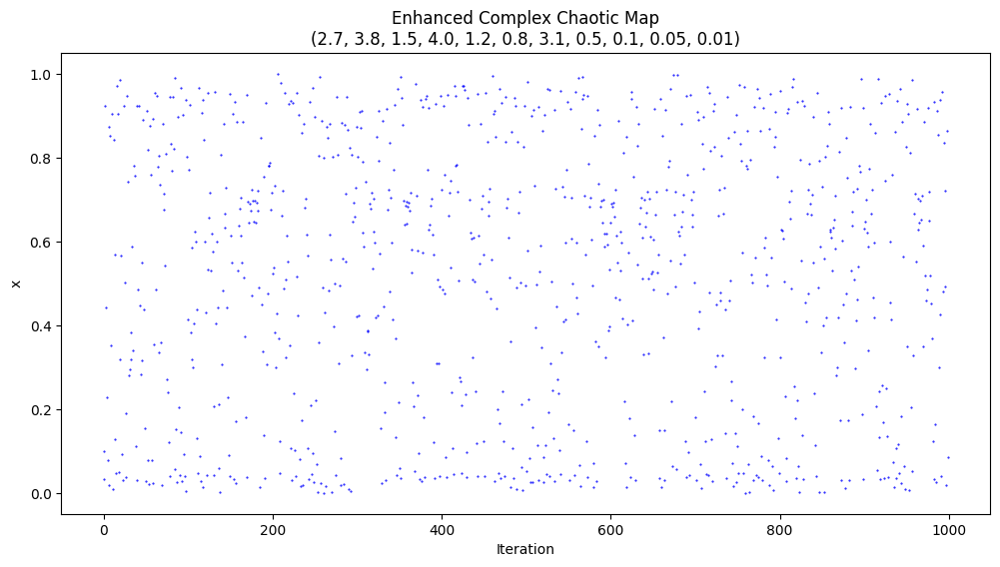

Lyapunov Exponent: 22.261481765286838
Entropy: -16.60951929356236


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def enhanced_complex_chaotic_map(x, a, b, c, d, e, f, g, h, xi, tau, eta):
    term1 = a * np.sin(np.pi * x**2)
    term2 = b * x * (1 - x**3)
    term3 = c * np.tanh(d * np.sqrt(abs(1 - x)))
    term4 = e * np.log(1 + abs(x))
    term5 = f * np.cos(g * np.pi * x)
    term6 = h * np.exp(-x**2)
    delay_term = xi * np.sin(np.pi * (x - tau))
    noise_term = eta * (2 * np.random.random() - 1)
    return (term1 + term2 + term3 + term4 + term5 + term6 + delay_term + noise_term) % 1

def plot_sequence(x0, params, n):
    x = x0
    x_vals = np.zeros(n)
    for i in range(n):
        x_vals[i] = x
        x = enhanced_complex_chaotic_map(x, *params)

    plt.figure(figsize=(12, 6))
    plt.plot(range(n), x_vals, 'b.', markersize=1)
    plt.title(f"Enhanced Complex Chaotic Map\n{params}")
    plt.xlabel("Iteration")
    plt.ylabel("x")
    plt.show()

def lyapunov_exponent(x0, params, n_iterations=10000, n_discard=1000):
    x = x0
    lyap = 0

    for _ in range(n_discard):
        x = enhanced_complex_chaotic_map(x, *params)

    for _ in range(n_iterations):
        x_new = enhanced_complex_chaotic_map(x, *params)
        dx = abs(enhanced_complex_chaotic_map(x + 1e-12, *params) - x_new)
        lyap += np.log(abs(dx / 1e-12))
        x = x_new

    return lyap / n_iterations

def entropy(x_vals, num_bins=100):
    hist, _ = np.histogram(x_vals, bins=num_bins, density=True)
    hist = hist[hist > 0]
    return -np.sum(hist * np.log(hist))

# Parameters
x0 = 0.1
params = (2.7, 3.8, 1.5, 4.0, 1.2, 0.8, 3.1, 0.5, 0.1, 0.05, 0.01)
n = 1000

# Plot the sequence
plot_sequence(x0, params, n)

# Calculate and print the Lyapunov exponent
lyap_exp = lyapunov_exponent(x0, params)
print(f"Lyapunov Exponent: {lyap_exp}")

# Calculate and print the entropy
x_vals = [x0]
x = x0
for _ in range(n):
    x = enhanced_complex_chaotic_map(x, *params)
    x_vals.append(x)

x_vals = np.array(x_vals)
entropy_value = entropy(x_vals)
print(f"Entropy: {entropy_value}")
